In [92]:
import os
import re
import subprocess
from collections import defaultdict
import numpy as np
import rasterio
from rasterio.merge import merge
from rasterio.warp import reproject, Resampling
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import glob

#import geopandas as gpd
import pandas as pd

%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')

import utils.basics as bsc 
import utils.plotting as pt
import utils.processing as proc
import utils.eval_pipe as eval

import utils.model_loader as md
import utils.data_loader as dt
import utils.config_loader as cf

%load_ext autoreload
%autoreload 2

sites = cf.load_yaml("../configs/datapaths.yaml")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [93]:
sites

{'SITE1': {'CHM': '../data/01_input_pipeline/01_Ebrach/01_CHM.tif',
  'CHM_norm': '../data/01_input_pipeline/01_Ebrach/01_CHM_norm111.tif',
  'CHM_norm_params': {'mu': 29.069731736028462, 'std': 7.518862605606749},
  'DEM': '../data/01_input_pipeline/01_Ebrach/01_DEM10.tif',
  'DLT': '../data/01_input_pipeline/01_Ebrach/01_DLT_P.tif',
  'FMASK': '../data/01_input_pipeline/01_Ebrach/01_FMA_P.tif',
  'NAME': 'Ebrach',
  'PATH': '../data/01_input_pipeline/01_Ebrach',
  'PATHF': '../data/01_input_pipeline/01_Ebrach/01_',
  'S2': {'autumn': '../data/01_input_pipeline/01_Ebrach/S2/autumn/S2_stacked.tif',
   'spring': '../data/01_input_pipeline/01_Ebrach/S2/spring/S2_stacked.tif',
   'summer': '../data/01_input_pipeline/01_Ebrach/S2/summer/S2_stacked.tif'},
  'S2_norm': {'autumn': '../data/01_input_pipeline/01_Ebrach/S2/autumn/S2_stacked_norm.tif',
   'spring': '../data/01_input_pipeline/01_Ebrach/S2/spring/S2_stacked_norm.tif',
   'summer': '../data/01_input_pipeline/01_Ebrach/S2/summer/S2_s

## load rasters

In [172]:
from rasterio import open as rio_open

# Initialize a dictionary to store the loaded data
loaded_data = {}

# Iterate through each site in the `sites` dictionary
for site_name, site_paths in sites.items():
    real_name = site_paths['NAME']
    loaded_data[real_name] = {}
    
    # Load CHM
    with rio_open(site_paths['CHM']) as src:
        loaded_data[real_name]['CHM'] = src.read(1)
        loaded_data[real_name]['CHM_transform'] = src.transform

    # Load CHM normalized
    # with rio_open(site_paths['CHM_norm']) as src:
    #     loaded_data[real_name]['CHM_norm'] = src.read(1)

    # Load DEM
    with rio_open(site_paths['DEM']) as src:
        loaded_data[real_name]['DEM'] = src.read(1)
        loaded_data[real_name]['DEM_transform'] = src.transform

    # Load DLT
    with rio_open(site_paths['DLT']) as src:
        loaded_data[real_name]['DLT'] = src.read(1)
        loaded_data[real_name]['DLT_transform'] = src.transform

    # Load FMASK
    with rio_open(site_paths['FMASK']) as src:
        loaded_data[real_name]['FMASK'] = src.read(1)
        loaded_data[real_name]['FMASK_transform'] = src.transform

    # # Load S2 data for each season
    # loaded_data[real_name]['S2'] = {}
    # for season, s2_path in site_paths['S2'].items():
    #     with rio_open(s2_path) as src:
    #         loaded_data[real_name]['S2'][season] = src.read()
    
    # Load S2 normalized data for each season
    loaded_data[real_name]['S2_norm'] = {}
    for season, s2_norm_path in site_paths['S2_norm'].items():
        loaded_data[real_name]['S2_norm'][season], _ = dt.read_multiband_tif_as_stack(s2_norm_path)

    #break
print("Data loaded successfully.")

Data loaded successfully.


In [174]:
# memory = sum(
#     data.nbytes if isinstance(data, np.ndarray) else sum(sub_data.nbytes for sub_data in data.values())
#     for site_data in loaded_data.values()
#     for data in site_data.values()
# ) / (1024 ** 2)  # Convert to MB
print("Memory size of loaded data:", memory, "MB")
#print the size of loaded_data
for site_name, site_data in loaded_data.items():
    print(f"Site: {site_name}")
    for data_type, data_value in site_data.items():
        if isinstance(data_value, dict):
            for sub_type, sub_value in data_value.items():
                print(f"  {data_type} - {sub_type}: {sub_value.shape}")
        else:
            print(f"  {data_type}: {data_value.shape}")

Memory size of loaded data: 4405.707683563232 MB
Site: Ebrach
  CHM: (846, 1241)


AttributeError: 'Affine' object has no attribute 'shape'

## plot the images

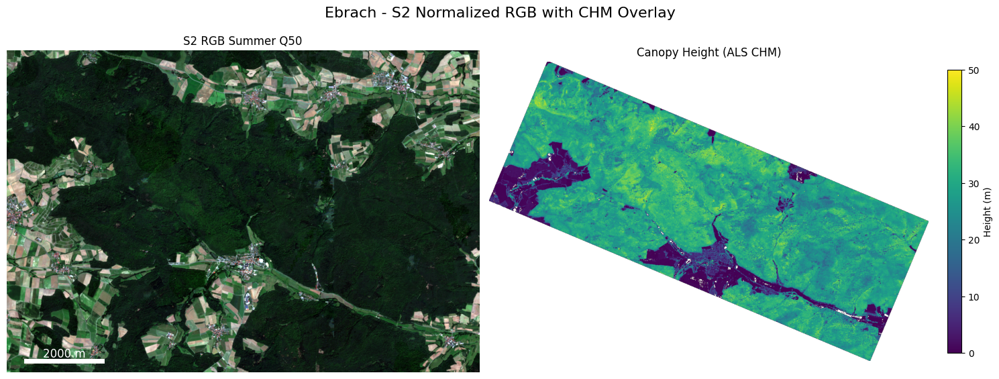

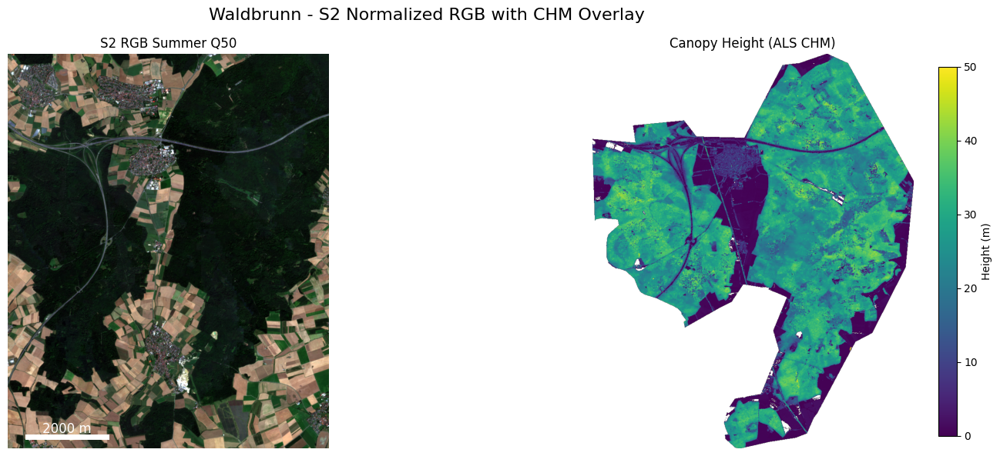

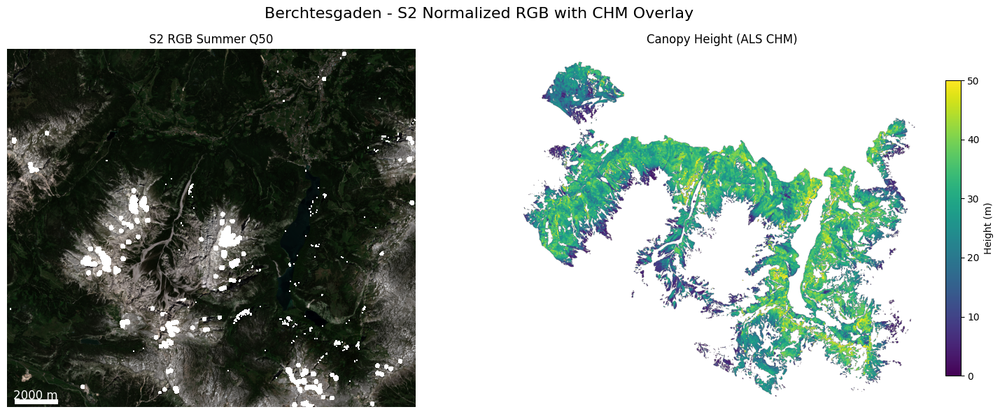

In [ ]:
site_names = list(loaded_data.keys())

for site in site_names:
    s2temp_ = loaded_data[site]['S2_norm']['summer'] # shape 13, 5, H, W
    s2temp = s2temp_[:, 1, :, :]  # Select season 'summer', season index 1, all bands
    chm_temp = loaded_data[site]['CHM']

    pt.plot_full_image(s2temp, chm_temp, band_idxs=[10,3,0], title=f"{site} - S2 RGB and Canopy Height (ALS-Reference)")


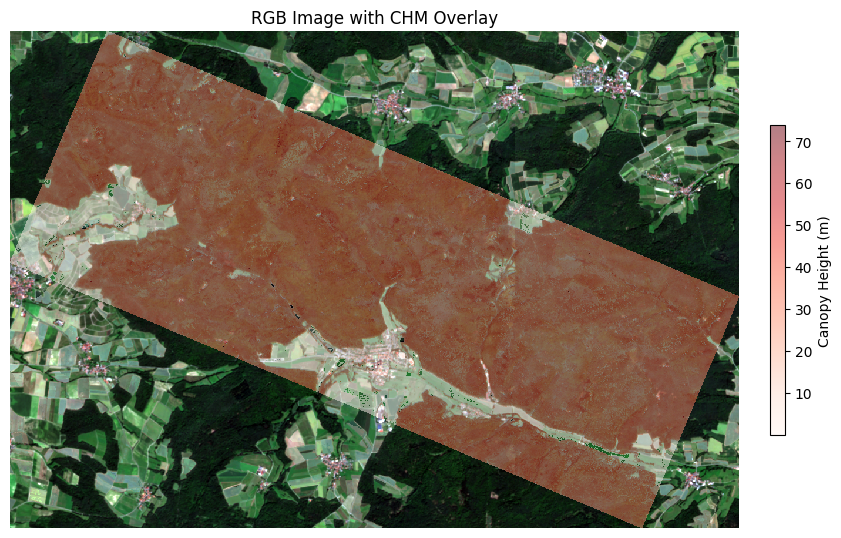

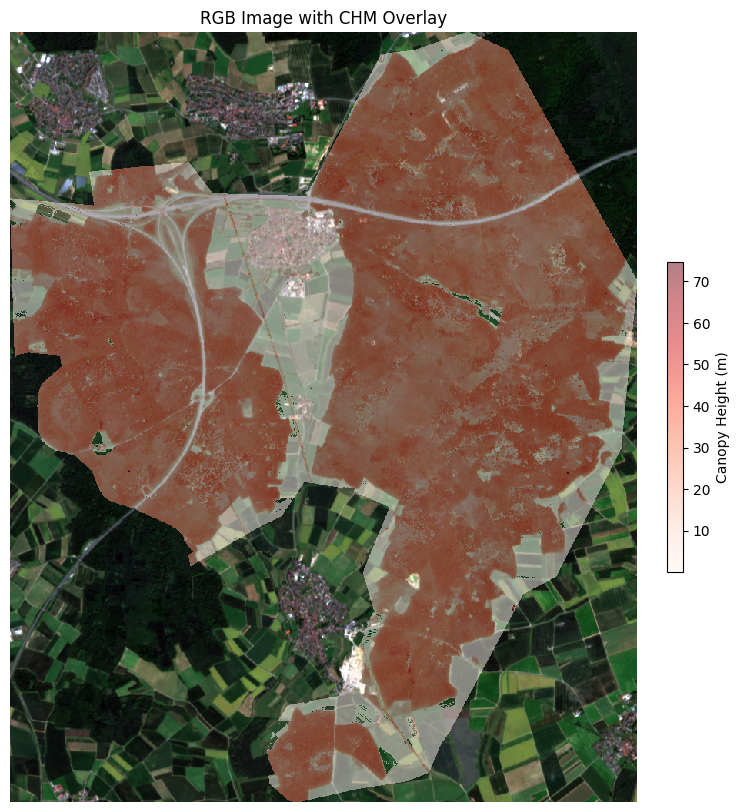

In [6]:
pt.plot_overlay(s2_np, als_np,norm_rgb=False) # already normalized
pt.plot_overlay(s2_np2, als_np2, norm_rgb=False) # already normalized


## overlays of aux layers

/Users/felix/miniconda3/envs/CHM/lib/python3.12/site-packages/matplotlib/colorizer.py:191: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/Users/felix/miniconda3/envs/CHM/lib/python3.12/site-packages/matplotlib/colorizer.py:191: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/Users/felix/miniconda3/envs/CHM/lib/python3.12/site-packages/matplotlib/colorizer.py:191: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


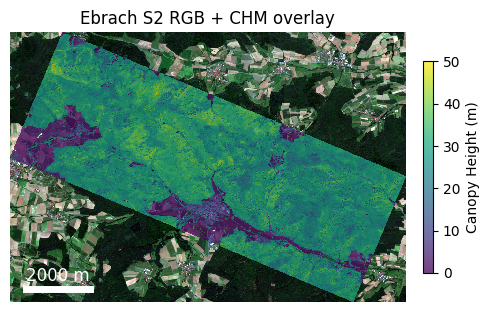

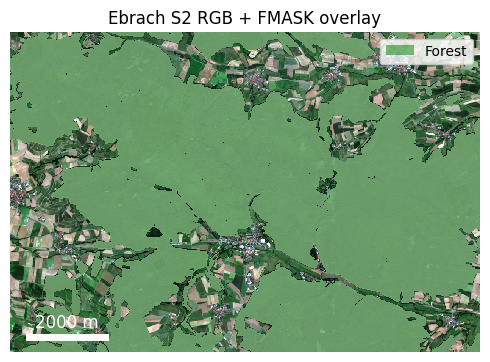

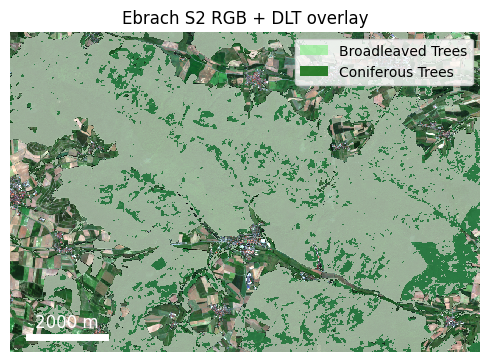

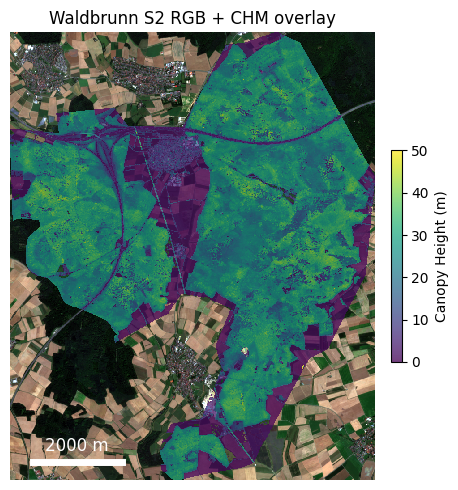

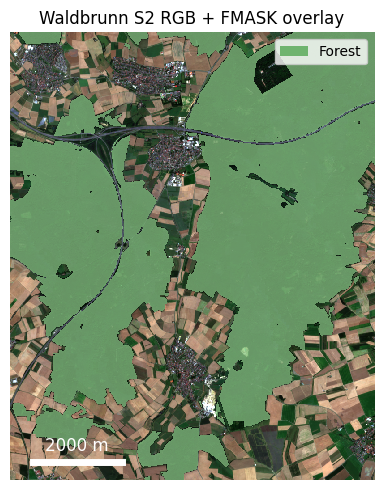

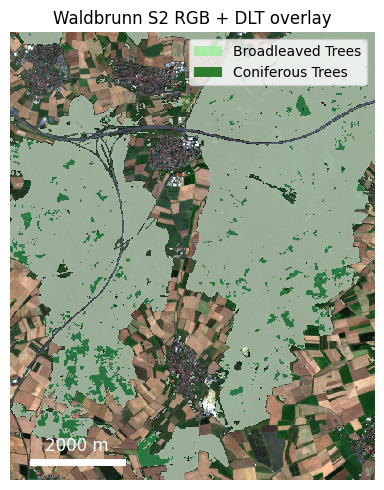

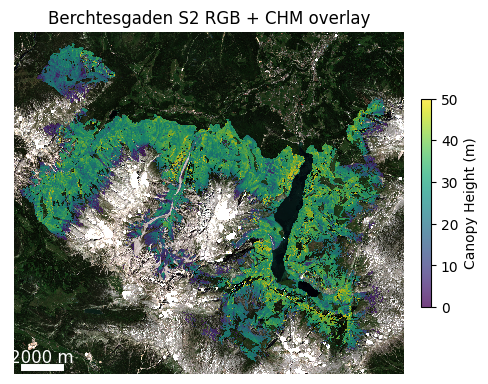

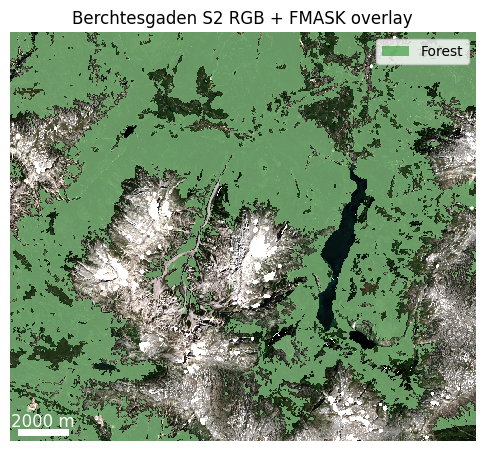

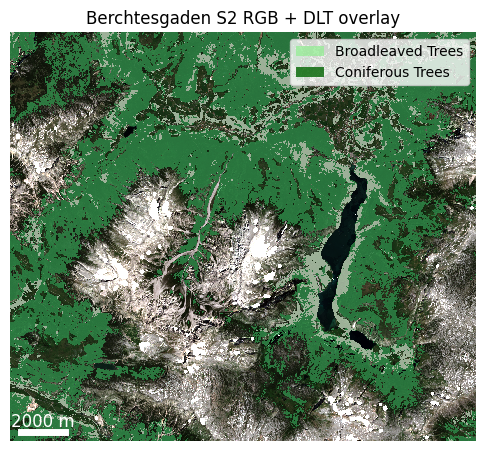

In [248]:
site_names = list(loaded_data.keys())

for site in site_names:
    s2temp_ = loaded_data[site]['S2_norm']['summer'] # shape 13, 5, H, W
    s2temp = s2temp_[:, 1, :, :]  # Select season 'summer', season index 1, all bands
    rgb = s2temp[[10, 3, 0], :, :].transpose(1, 2, 0)
    if site == "Berchtesgaden":
        rgb = np.clip(rgb * 1.5, 0, 1)
    chm_temp = loaded_data[site]['CHM']
    fmask_temp = loaded_data[site]['FMASK']
    dlt_temp = loaded_data[site]['DLT']
    
    
    a = pt.plot_rgb_and_x(rgb,chm_temp,title = site + " S2 RGB + CHM overlay", type="CHM")
    b = pt.plot_rgb_and_x(rgb, fmask_temp,title = site + " S2 RGB + FMASK overlay", type="FMASK")
    c = pt.plot_rgb_and_x(rgb, dlt_temp, title = site + " S2 RGB + DLT overlay", type="DLT")




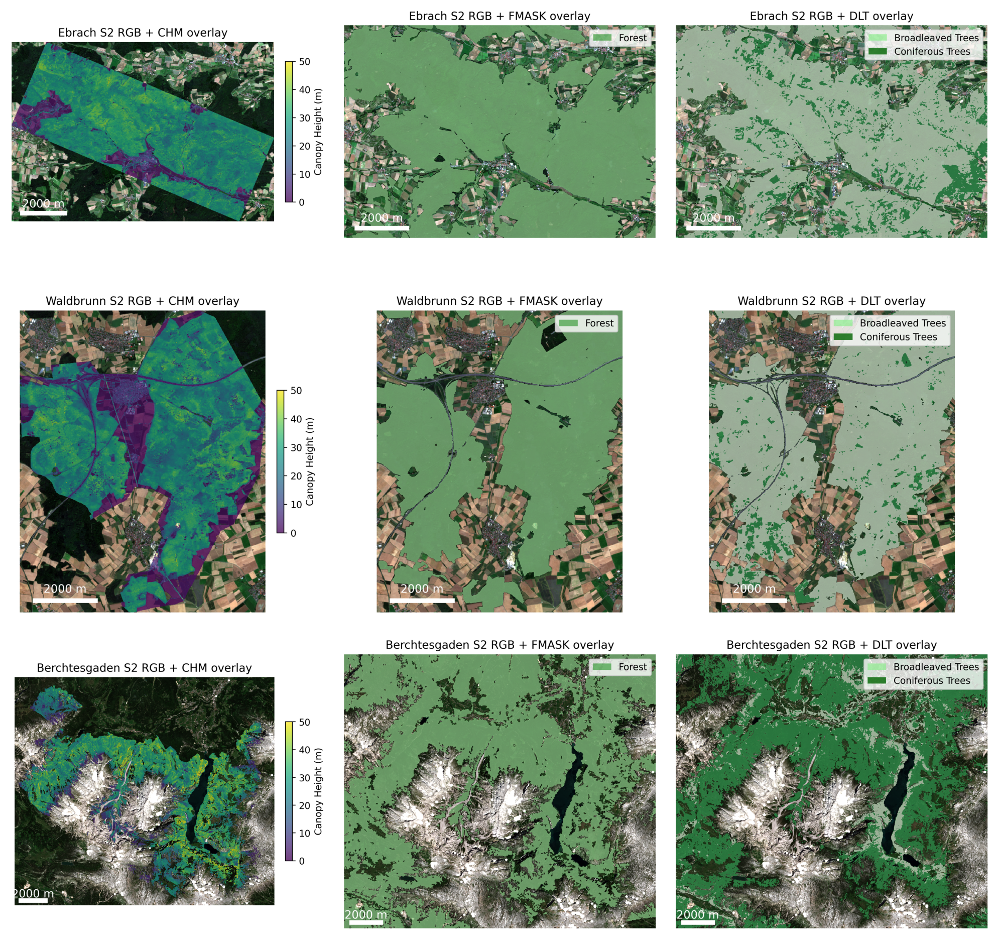

In [249]:
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
basepath = "../data/10_insights/"

for i, site in enumerate(site_names):
    img_chm = plt.imread(basepath + site + "_CHM.png")
    img_fmask = plt.imread(basepath + site + "_FMASK.png")
    img_dlt = plt.imread(basepath + site + "_DLT.png")

    axes[i, 0].imshow(img_chm)
    #axes[i, 0].set_title(f"{site} CHM")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(img_fmask)
    #axes[i, 1].set_title(f"{site} FMASK")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(img_dlt)
    #axes[i, 2].set_title(f"{site} DLT")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(basepath + "00_overview_grid.png", dpi=100, bbox_inches='tight')
plt.savefig(basepath + "00_overview_grid.pdf", dpi=100, bbox_inches='tight')
plt.show()

## ALS distributions

Overall ALS Canopy Height Area:  (1902765,) 10x10m points, e.g., 19027.65 ha  or 190.2765 km²


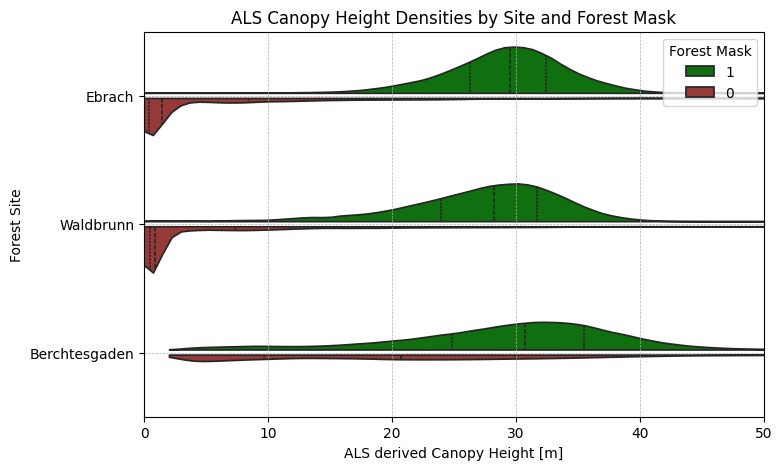

Figure saved as ../data/10_insights/ALS_Canopy_Height_Densities.png and ../data/10_insights/ALS_Canopy_Height_Densities.pdf


In [ ]:
import seaborn as sns
site_names = list(loaded_data.keys())

# fig, ax = plt.subplots(figsize=(12, 6))
df_als = pd.DataFrame()

for site in site_names:

    als_flat = loaded_data[site]['CHM'].flatten()
    fmask_flat = loaded_data[site]['FMASK'].flatten()
    df_site = pd.DataFrame({'Site': site, 'ALS': als_flat, 'ForestMask': fmask_flat})
    df_als = pd.concat([df_als, df_site], ignore_index=True)


df_als = df_als.dropna(subset=['ALS', 'ForestMask'])
df_als['ForestMask'] = df_als['ForestMask'].astype(int).astype('category')

valid_chm = df_als['ALS'][~np.isnan(df_als['ALS']) & (df_als['ALS'] >= 0)]

# mean_chm = np.mean(valid_chm)
# std_chm = np.std(valid_chm)

print("Overall ALS Canopy Height Area: ", valid_chm.shape, "10x10m points, e.g.,", valid_chm.shape[0]*100 / 1e4, "ha", " or", valid_chm.shape[0] * 100 / 1e6, "km²")

fig, ax = plt.subplots(figsize=(8, 5))
df_als['ForestMask'] = df_als['ForestMask'].cat.reorder_categories([1, 0], ordered=True)
palette = {1: "green", 0: "brown"}

palette = dict(map(lambda x: (x, "green" if x == 1 else "brown"), df_als['ForestMask'].cat.categories))
fig = sns.violinplot(data=df_als, x="ALS", y="Site", hue="ForestMask", split=True, gap=0.1, inner="quart", bw_adjust=1 , cut=0, common_norm=False, palette=palette)
fig.grid(True, which='both', linestyle='--', linewidth=0.5)
fig.set_title("ALS Canopy Height Densities by Site and Forest Mask")
fig.set_xlim(0, 50)
fig.set_xlabel("ALS derived Canopy Height [m]")
fig.set_ylabel("Forest Site")
plt.legend(title='Forest Mask', loc='upper right')
plt.show()

output_folder = "../data/10_insights/"
output_filename = "ALS_Canopy_Height_Densities"

# Save the figure as PNG
fig.figure.savefig(f"{output_folder}{output_filename}.png", dpi=300, bbox_inches='tight')

# Save the figure as PDF
fig.figure.savefig(f"{output_folder}{output_filename}.pdf", dpi=300, bbox_inches='tight')

print(f"Figure saved as {output_folder}{output_filename}.png and {output_folder}{output_filename}.pdf")


# ax.hist(valid_chm, bins=50, alpha=0.5, label=f"{site} (Mean: {mean_chm:.2f}, Std: {std_chm:.2f})")


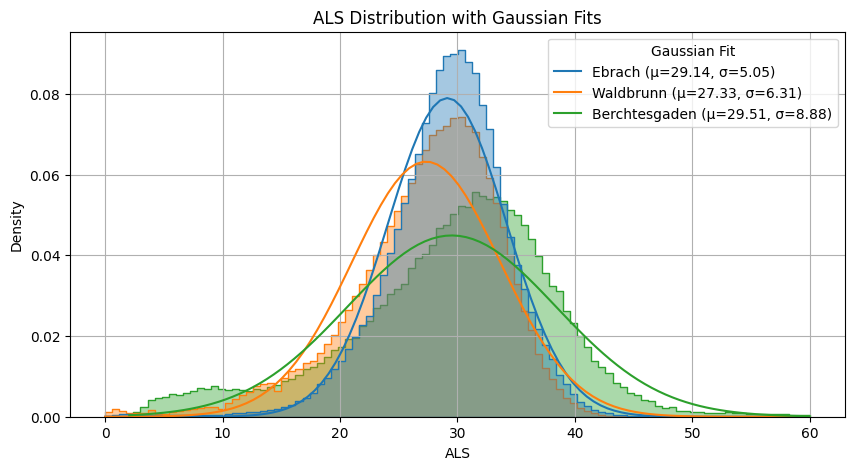

In [303]:
from scipy.stats import norm

df_forest = df_als[(df_als["ForestMask"]==1) & (df_als["ALS"]<60)]
fig = plt.figure(figsize=(10,5))
sns.histplot(data=df_forest, x="ALS", hue="Site", element="step", stat="density", common_norm=False, bins=100, alpha=0.4)
# Fit a Gaussian for each site

for site in df_forest['Site'].unique():
    site_data = df_forest[df_forest['Site'] == site]['ALS']
    mu, std = norm.fit(site_data)
    x = np.linspace(site_data.min(), site_data.max(), 100)
    plt.plot(x, norm.pdf(x, mu, std), label=f"{site} (μ={mu:.2f}, σ={std:.2f})")

plt.legend(title="Gaussian Fit")
plt.title("ALS Distribution with Gaussian Fits")
plt.xlabel("ALS")
plt.ylabel("Density")
plt.grid()
plt.show()


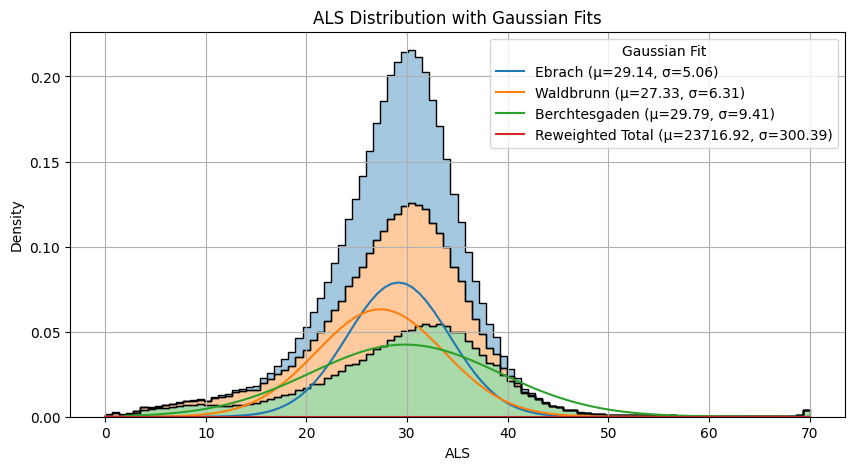

In [321]:
from scipy.stats import norm

df_forest = df_als[(df_als["ForestMask"]==1) & (df_als["ALS"]<70) & (df_als["ALS"]>0)]
fig = plt.figure(figsize=(10,5))
sns.histplot(data=df_forest, x="ALS", hue="Site", element="step", stat="density",  bins=100, multiple="stack", common_norm=False, alpha=0.4)
# Fit a Gaussian for each site

big_mu, big_sig = 1,1 

for site in df_forest['Site'].unique():
    site_data = df_forest[df_forest['Site'] == site]['ALS']
    mu, std = norm.fit(site_data)
    x = np.linspace(site_data.min(), site_data.max(), 100)
    plt.plot(x, norm.pdf(x, mu, std), label=f"{site} (μ={mu:.2f}, σ={std:.2f})")
    big_mu, big_sig = big_mu*mu, big_sig*std
# Calculate weights for each site based on their occurrence
site_weights = df_forest['Site'].value_counts(normalize=True).to_dict()

# Reweight the ALS counts for each site
weighted_counts = []
for site in df_forest['Site'].unique():
    site_data = df_forest[df_forest['Site'] == site]['ALS']
    weight = 1 / site_weights[site]  # Inverse of occurrence to balance contribution
    weighted_counts.extend([weight] * len(site_data))

# Fit a Gaussian to the reweighted ALS counts
weighted_als = np.repeat(df_forest['ALS'].values, weighted_counts)
mu, std = norm.fit(weighted_als)
x = np.linspace(weighted_als.min(), weighted_als.max(), 100)
mu = big_mu#29.069
std= big_sig#7.518
plt.plot(x, norm.pdf(x, mu, std), label=f"Reweighted Total (μ={mu:.2f}, σ={std:.2f})")

plt.legend(title="Gaussian Fit")
plt.title("ALS Distribution with Gaussian Fits")
plt.xlabel("ALS")
plt.ylabel("Density")
plt.grid()
plt.show()

In [ ]:
       _111={'mu': 29.069731736028462,
                'std': 7.518862605606749,

,Site,ALS,ForestMask
164,Ebrach,1.830,0
165,Ebrach,0.560,0
166,Ebrach,0.090,0
167,Ebrach,0.120,0
1405,Ebrach,1.830,0
...,...,...,...
5727736,Berchtesgaden,3.424,0
5727737,Berchtesgaden,2.984,0
5727738,Berchtesgaden,2.684,0
5727739,Berchtesgaden,2.466,0


In [ ]:
site_names = list(loaded_data.keys())

for site in site_names:
    s2temp_ = loaded_data[site]['S2_norm']['summer'] # shape 13, 5, H, W
    s2temp = s2temp_[:, 1, :, :]  # Select season 'summer', season index 1, all bands
    rgb = s2temp[[10, 3, 0], :, :].transpose(1, 2, 0)
    if site == "Berchtesgaden":
        rgb = np.clip(rgb * 1.5, 0, 1)
    chm_temp = loaded_data[site]['CHM']
    fmask_temp = loaded_data[site]['FMASK']
    dlt_temp = loaded_data[site]['DLT']

## Bavaria + ALS 

Base layer CRS: EPSG:4326


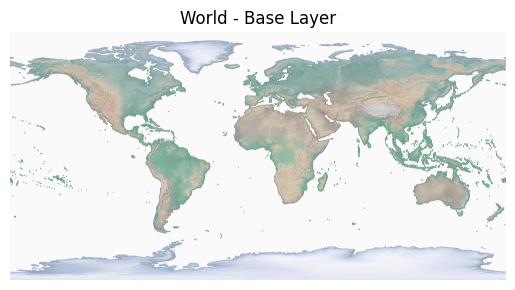

In [156]:
# Load the base layer map of the world
baselayer_world = "../data/05_baselayers/HYP_50M_SR/HYP_50M_SR.tif"

with rasterio.open(baselayer_world) as src:
    baselayer_data = src.read()
    baselayer_transform = src.transform
    bl_crs = src.crs

print("Base layer CRS:", bl_crs)
# its a 3 channel rgb image
# Plot the base layer

plt.imshow(baselayer_data.transpose(1, 2, 0))
plt.title("World - Base Layer")
plt.axis("off")
plt.show()


Base data type: uint8
Target CRS (ALS): EPSG:25832
Baselayer CRS: EPSG:4326


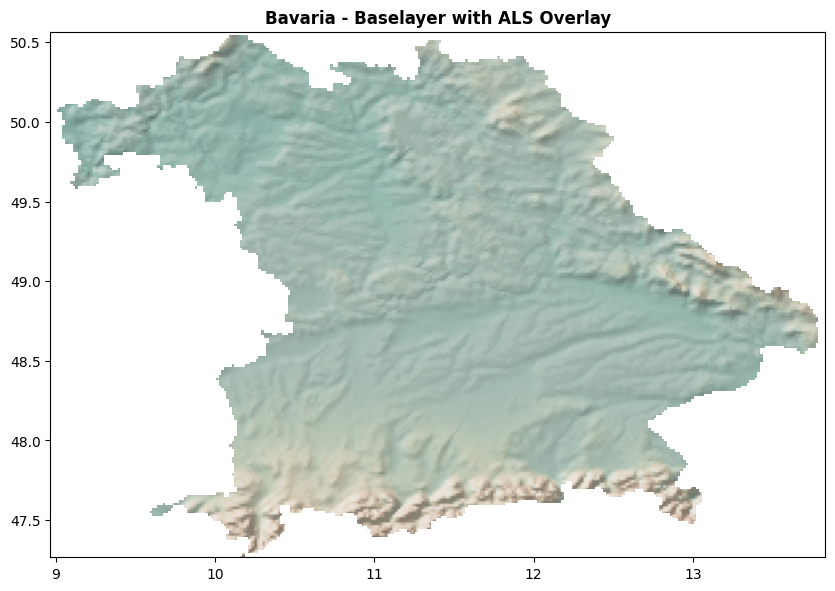

In [170]:
import geopandas as gpd
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
from rasterio.plot import show

#baselayer_world_raster = "../data/05_baselayers/HYP_50M_SR/HYP_50M_SR.tif" #50m
baselayer_world_raster = "../data/05_baselayers/HYP_HR_SR_W/HYP_HR_SR_W.tif" #10m

naturalearth_folder = "../data/05_baselayers/Natural_Earth_quick_start/10m_cultural"

# Load the Germany shapefile from the Natural Earth folder
germany_shapefile = f"{naturalearth_folder}/ne_10m_admin_0_countries.shp"
bavaria_shapefile = f"{naturalearth_folder}/ne_10m_admin_1_states_provinces.shp"
germany_gdf = gpd.read_file(germany_shapefile)
bavaria_gdf = gpd.read_file(bavaria_shapefile)

# Filter for Germany
germany_gdf = germany_gdf[germany_gdf['ADMIN'] == 'Germany']
# Filter for Bavaria
bavaria_gdf = bavaria_gdf[bavaria_gdf['gns_name'] == 'Bayern']

# Ensure the CRS of the shapefile matches the raster
with rasterio.open(baselayer_world_raster) as src: 
    baselayer_crs = src.crs
    bavaria_gdf = bavaria_gdf.to_crs(baselayer_crs) 
    

# crop baselayer to bavaria 
with rasterio.open(baselayer_world_raster) as src:
    baselayer_bavaria, baselayer_transform = mask(src, bavaria_gdf.geometry, crop=True)
    print("Base data type:", baselayer_bavaria.dtype)
    baselayer_bavaria = baselayer_bavaria.astype(np.float32)
    baselayer_bavaria = baselayer_bavaria / 255.0  # Normalize to [0, 1]
    baselayer_bavaria[baselayer_bavaria==0] = np.nan
    baselayer_meta = src.meta.copy()
    baselayer_meta.update({
        "height": baselayer_bavaria.shape[1],
        "width": baselayer_bavaria.shape[2],
        "transform": baselayer_transform,
        "dtype": 'float32'  # Update dtype to float32
    })

    # Save the cropped baselayer
    with rasterio.open("../data/05_baselayers/HYP_HR_SR_W/HYP_HR_SR_W_bavaria.tif", "w", **baselayer_meta) as dst:
        dst.write(baselayer_bavaria)


with rasterio.open(sites['SITE1']['CHM']) as als:
    als_crs = als.crs
    #target_transform = als.transform

print("Target CRS (ALS):", als_crs)
print("Baselayer CRS:", baselayer_crs)

# Reproject ALS data to match the baselayer CRS
with rasterio.open(sites['SITE1']['CHM']) as als:
    als_data = als.read(1)
    als_transform = als.transform
    als_crs = als.crs

    # Define the output array and transform
    als_reprojected = np.empty_like(baselayer_bavaria[0], dtype=np.float32)
    reproject(
        source=als_data,
        destination=als_reprojected,
        src_transform=als_transform,
        src_crs=als_crs,
        dst_transform=baselayer_transform,
        dst_crs=baselayer_crs,
        resampling=Resampling.bilinear,
    )



# Plot the baselayer and ALS overlay
fig, ax = plt.subplots(figsize=(10, 15))
show(baselayer_bavaria, transform=baselayer_transform, ax=ax, title="Bavaria - Baselayer with ALS Overlay")
# Fill everything inside ALS area as solid red and plot as overlay

plt.axis("on")
plt.show()

# plt.imshow(baselayer_bavaria.transpose(1, 2, 0))
# plt.title("Bavaria - Base Layer")
# plt.axis("off")
# plt.show()

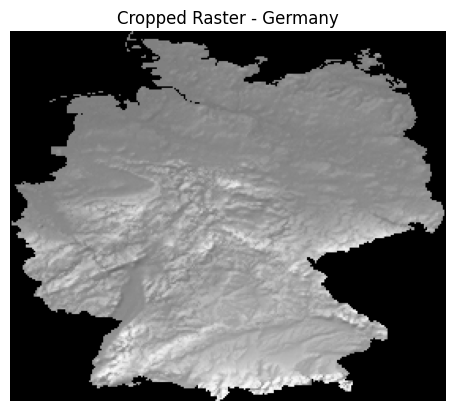

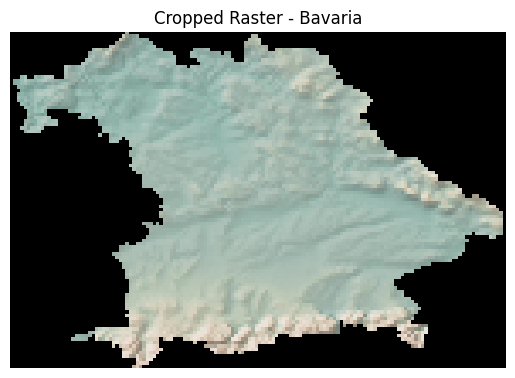

In [96]:
import geopandas as gpd
from rasterio.mask import mask

baselayer_world_raster = "../data/05_baselayers/HYP_50M_SR/HYP_50M_SR.tif"
naturalearth_folder = "../data/05_baselayers/Natural_Earth_quick_start/10m_cultural"

# Load the Germany shapefile from the Natural Earth folder
germany_shapefile = f"{naturalearth_folder}/ne_10m_admin_0_countries.shp"
bavaria_shapefile = f"{naturalearth_folder}/ne_10m_admin_1_states_provinces.shp"
germany_gdf = gpd.read_file(germany_shapefile)
bavaria_gdf = gpd.read_file(bavaria_shapefile)

# Filter for Germany
germany_gdf = germany_gdf[germany_gdf['ADMIN'] == 'Germany']
# Filter for Bavaria
bavaria_gdf = bavaria_gdf[bavaria_gdf['gns_name'] == 'Bayern']


with rasterio.open(sites['SITE1']['CHM']) as als:
    target_crs = als.crs

# Ensure the CRS of the shapefile matches the raster
with rasterio.open(baselayer_world_raster) as src:
    # Reproject the baselayer to match the target CRS
    transform, width, height = calculate_default_transform(
        src.crs, target_crs, src.width, src.height, *src.bounds
    )
    baselayer_data = np.empty((src.count, height, width), dtype=src.dtypes[0])

    for i in range(1, src.count + 1):
        reproject(
            source=rasterio.band(src, i),
            destination=baselayer_data[i - 1],
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs=target_crs,
            resampling=Resampling.nearest,
        )


    if germany_gdf.crs != src.crs:
        germany_gdf = germany_gdf.to_crs(src.crs)
    if bavaria_gdf.crs != src.crs:
        bavaria_gdf = bavaria_gdf.to_crs(src.crs)

    # Crop the world raster to Germany using rasterio
    germany_raster, germany_transform = mask(src, germany_gdf.geometry, crop=True)
    germany_raster = germany_raster[0]  # Extract the first band
    bavaria_raster, bavaria_transform = mask(src, bavaria_gdf.geometry, crop=True)
    #bavaria_raster = bavaria_raster[0]  # Extract the first band
#bavaria_raster = bavaria_raster.to_crs(target_crs)

# Plot the cropped raster
plt.imshow(germany_raster, cmap='gray', extent=[
    germany_transform.c, 
    germany_transform.c + germany_transform.a * germany_raster.shape[1],
    germany_transform.f + germany_transform.e * germany_raster.shape[0],
    germany_transform.f
])
plt.title("Cropped Raster - Germany")
plt.axis("off")
plt.show()

# plot bavaria
plt.imshow(bavaria_raster.transpose(1, 2, 0), extent=[
    bavaria_transform.c, 
    bavaria_transform.c + bavaria_transform.a * bavaria_raster.shape[2],
    bavaria_transform.f + bavaria_transform.e * bavaria_raster.shape[1],
    bavaria_transform.f
])
plt.title("Cropped Raster - Bavaria")
plt.axis("off")
plt.show()




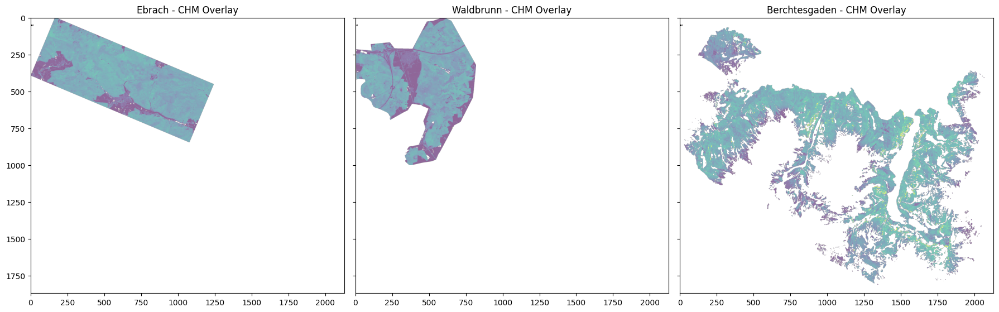

In [70]:
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
import geopandas as gpd
from rasterio.warp import calculate_default_transform, reproject, Resampling
import matplotlib.pyplot as plt

# Load the base layer map of the world
baselayer_world = "../data/05_baselayers/HYP_50M_SR/HYP_50M_SR.tif"

# Define the CHM rasters and their corresponding site names
chm_rasters = [loaded_data[site]['CHM'] for site in site_names]

# Reproject CHM rasters to match the world map's CRS and resolution
reprojected_chms = []
for site_name in site_names:
    chm = loaded_data[site_name]['CHM']
    with rasterio.open(site_paths['CHM']) as src:
        chm_transform = src.transform
        chm_crs = src.crs

        # Calculate the transform and dimensions for the reprojected CHM
        transform, width, height = calculate_default_transform(
            chm_crs, src.crs, chm.shape[1], chm.shape[0], *src.bounds
        )
        reprojected_chm = np.empty((height, width), dtype=chm.dtype)

        # Reproject the CHM
        reproject(
            source=chm,
            destination=reprojected_chm,
            src_transform=chm_transform,
            src_crs=chm_crs,
            dst_transform=transform,
            dst_crs=src.crs,
            resampling=Resampling.bilinear,
        )
        reprojected_chms.append(reprojected_chm)

# Load Germany shapefile
germany_shapefile = "../data/05_baselayers/Germany_shapefile/de_10km.shp"
germany_gdf = gpd.read_file(germany_shapefile)

# Ensure the CRS of the shapefile matches the raster
with rasterio.open(baselayer_world) as src:
    if germany_gdf.crs != src.crs:
        germany_gdf = germany_gdf.to_crs(src.crs)

    # Crop the world map to Germany using rasterio
    germany_map, germany_transform = mask(src, germany_gdf.geometry, crop=True)
    germany_map = germany_map[0]  # Extract the first band

# Plot the base map and overlay the CHM rasters
fig, axes = plt.subplots(1, len(site_names), figsize=(18, 6), sharex=True, sharey=True)

for ax, chm, site_name in zip(axes, chm_rasters, site_names):
    # Plot the cropped Germany map as the base layer
    show(germany_map, transform=germany_transform, ax=ax, cmap='gray', title=f"{site_name} - CHM")
    # Overlay the CHM raster
    show(chm, ax=ax, cmap='viridis', alpha=0.6)
    ax.set_title(f"{site_name} - CHM Overlay")

plt.tight_layout()
plt.show()


In [53]:
bavaria_map

,name,ISO3166-1-Alpha-3,ISO3166-1-Alpha-2,geometry
0,Indonesia,IDN,ID,"MULTIPOLYGON (((117.70361 4.16342, 117.70361 4..."
1,Malaysia,MYS,MY,"MULTIPOLYGON (((117.70361 4.16342, 117.69711 4..."
2,Chile,CHL,CL,"MULTIPOLYGON (((-69.51009 -17.50659, -69.50611..."
3,Bolivia,BOL,BO,"POLYGON ((-69.51009 -17.50659, -69.51009 -17.5..."
4,Peru,PER,PE,"MULTIPOLYGON (((-69.51009 -17.50659, -69.63832..."
...,...,...,...,...
253,Macao S.A.R,MAC,MO,"MULTIPOLYGON (((113.5586 22.16303, 113.56943 2..."
254,Ashmore and Cartier Islands,-99,-99,"POLYGON ((123.59702 -12.42832, 123.59775 -12.4..."
255,Bajo Nuevo Bank (Petrel Is.),-99,-99,"POLYGON ((-79.98929 15.79495, -79.98782 15.796..."
256,Serranilla Bank,-99,-99,"POLYGON ((-78.63707 15.86209, -78.64041 15.864..."


## get data stats

In [7]:
# Get file sizes in megabytes (MB)
als_file_size = os.path.getsize(ALS_PATH2_RES) / (1024 * 1024)  # Convert bytes to MB
s2_file_size = os.path.getsize(S2_stacked_2) / (1024 * 1024)  # Convert bytes to MB

print(f"ALS file size: {als_file_size:.2f} MB")
print(f"S2 stacked multiband file size: {s2_file_size:.2f} MB")

ALS file size: 3.12 MB
S2 stacked multiband file size: 20.26 MB


In [8]:
def calculate_coverage_and_area(als, s2, band_idx=3, pixel_size=10):
    """
    Calculate the coverage and overlap between ALS and a specific S2 band.

    Parameters:
    - als: numpy array of ALS data (height, width)
    - s2: numpy array of S2 data (bands, height, width)
    - band_idx: index of the S2 band to compare (default: 3 for green channel)
    - pixel_size: size of one pixel in meters (default: 10m x 10m)

    Returns:
    - valid_pixel_count: number of valid overlapping pixels
    - percentage: percentage of ALS pixels with valid S2 data
    - area: area in square meters of valid overlapping pixels
    """
    # Mask invalid ALS and S2 data
    als_valid = ~np.isnan(als) & (als >= 0)
    s2_valid = ~np.isnan(s2[band_idx]) & (s2[band_idx] >= 0)

    # Calculate overlap
    valid_overlap = als_valid & s2_valid
    valid_pixel_count = np.sum(valid_overlap)

    # Calculate percentage and area
    total_als_pixels = np.sum(als_valid)
    percentage = (valid_pixel_count / total_als_pixels) * 100 if total_als_pixels > 0 else 0
    als_area_full = np.sum(als_valid) * (pixel_size ** 2) / 1e6   # Area in square kilometers
    area_km2_avail = valid_pixel_count * (pixel_size ** 2) / 1e6  # Convert to square kilometers

    # Calculate percentage of vegetated area with data availability
    vegetated_area = np.sum((als > 2) & ~np.isnan(als))
    vegetated_overlap = np.sum((als > 2) & valid_overlap)
    vegetated_percentage = (vegetated_overlap / vegetated_area) * 100 if vegetated_area > 0 else 0

    print(f"ALS area (all valid CHM):             {als_area_full:10.2f} km²")
    print(f"Valid overlapping pixels:               {valid_pixel_count:10,d}")
    print(f"Area of valid overlapping pixels:     {area_km2_avail:10.2f} km²")
    print(f"ALS pixels with valid S2 data:        {percentage:10.2f} %")
    print(f"Vegetated area with data availability:{vegetated_percentage:10.2f} % (CHM > 2m)")

    return #valid_pixel_count, percentage, als_area_full, area_km2_avail, vegetated_percentage


In [9]:
calculate_coverage_and_area(als_np, s2_np, band_idx=3)

ALS area (all valid CHM):                  49.85 km²
Valid overlapping pixels:                  498,465
Area of valid overlapping pixels:          49.85 km²
ALS pixels with valid S2 data:            100.00 %
Vegetated area with data availability:    100.00 % (CHM > 2m)


In [10]:
calculate_coverage_and_area(als_np2, s2_np2, band_idx=3)

ALS area (all valid CHM):                  44.41 km²
Valid overlapping pixels:                  444,050
Area of valid overlapping pixels:          44.41 km²
ALS pixels with valid S2 data:            100.00 %
Vegetated area with data availability:    100.00 % (CHM > 2m)


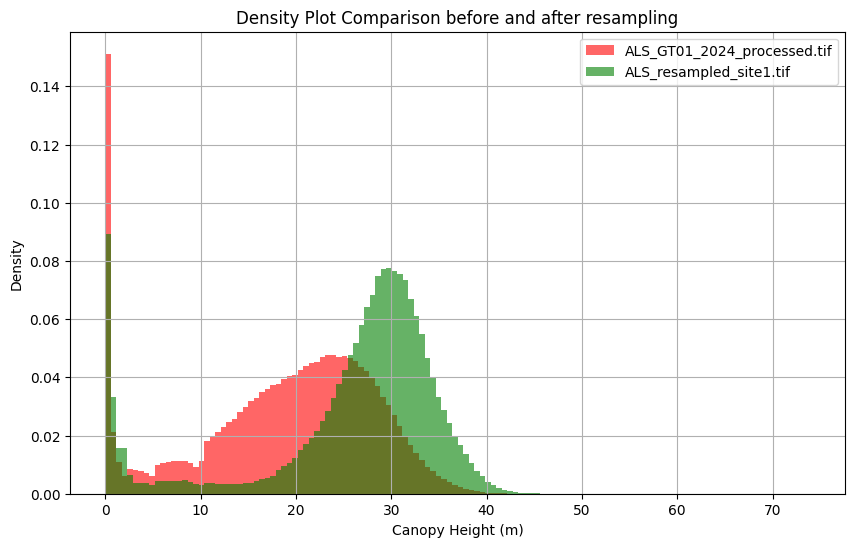


Percentiles Table:
            ALS_GT01_2024_processed.tif  ALS_resampled_site1.tif  delta
Percentile                                                             
0th                                0.00                     0.01   0.01
5th                                0.13                     0.56   0.43
10th                               1.18                     5.09   3.91
50th                              20.50                    28.55   8.05
75th                              25.91                    31.85   5.94
90th                              29.66                    34.66   5.00
95th                              31.70                    36.41   4.71
98th                              33.98                    38.25   4.27
99th                              35.46                    39.43   3.97
100th                             73.91                    73.91   0.00


In [45]:
pt.plot_two_density_and_percentiles(ALS_PATH1_P, ALS_PATH1_RES)

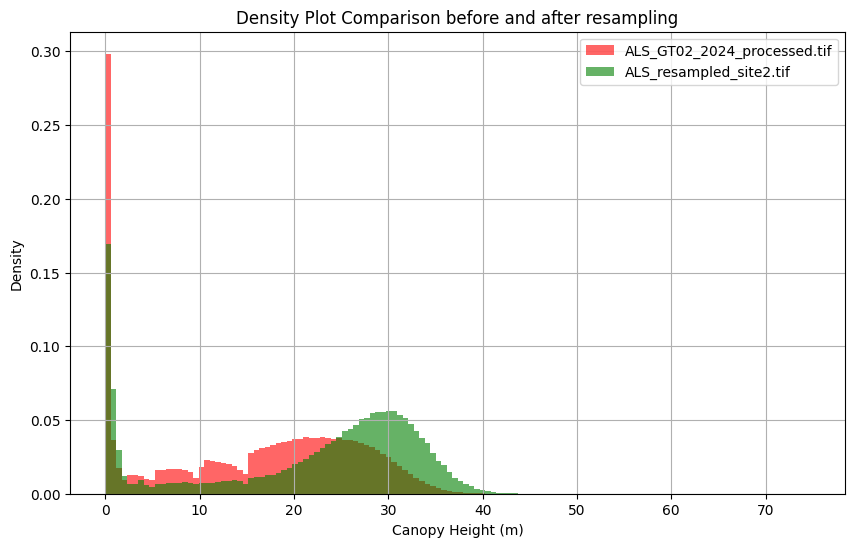


Percentiles Table:
            ALS_GT02_2024_processed.tif  ALS_resampled_site2.tif  delta
Percentile                                                             
0th                                0.00                     0.01   0.01
5th                                0.08                     0.39   0.31
10th                               0.20                     0.60   0.40
50th                              17.93                    25.78   7.85
75th                              24.69                    30.57   5.88
90th                              29.05                    33.67   4.62
95th                              31.11                    35.31   4.20
98th                              33.21                    37.14   3.93
99th                              34.55                    38.34   3.79
100th                             74.69                    74.69   0.00


In [46]:
pt.plot_two_density_and_percentiles(ALS_PATH2_P, ALS_PATH2_RES)

--> Cool, this distribution is somehow expected when doing a 98th percentile aggregation. We shift the distribution slightly to the right. 

## S2 Histograms

S2: Temporal composites: 
- basic approach: summer median composite (June - August) --> assumption, that underlying signal in S2 doenst change over this time; downside: coherence between pixels is lost.
- more sophisticated approach: stack temporal data; temporal dynamics are still inside

Indices to drop:
- EVI
- NBR 
- NDV 
--> drop them, cause they're indices, made up from the other bands. 
we drop them for better comparability to other approaches. 
-> Hypothesis: Model should learn better with Indices. 

How to normalize the remaining?
- raw BANDS: 0 to 1; clip to 0.1 and 99.9 percentile before.



,B1_BLU,B2_BNR,B3_EVI,B4_GRN,B5_NBR,B6_NDV,B7_NIR,B8_RE1,B9_RE2,B10_RE3,B11_RED,B12_SW1,B13_SW2
P0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P0.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P25,0.06,0.44,0.48,0.11,0.61,0.63,0.45,0.15,0.41,0.41,0.05,0.39,0.16
P50,0.09,0.51,0.56,0.16,0.71,0.71,0.51,0.20,0.47,0.48,0.07,0.45,0.19
P75,0.23,0.59,0.65,0.39,0.77,0.76,0.60,0.47,0.55,0.56,0.22,0.57,0.34
P95,0.53,0.76,0.80,0.63,0.89,0.90,0.77,0.69,0.75,0.74,0.55,0.74,0.54
P99.9,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
P100,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
NaN Ratio,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


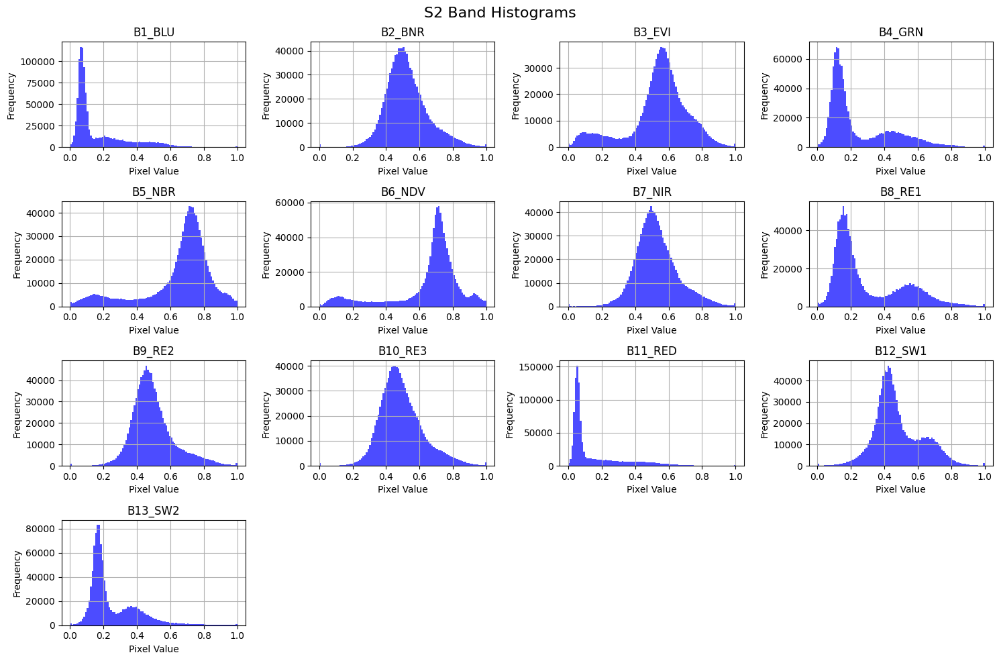

,B1_BLU,B2_BNR,B3_EVI,B4_GRN,B5_NBR,B6_NDV,B7_NIR,B8_RE1,B9_RE2,B10_RE3,B11_RED,B12_SW1,B13_SW2
P0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P0.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
P25,0.05,0.37,0.23,0.08,0.28,0.33,0.38,0.09,0.35,0.35,0.04,0.24,0.10
P50,0.09,0.45,0.60,0.12,0.77,0.86,0.47,0.15,0.42,0.43,0.07,0.30,0.14
P75,0.17,0.53,0.70,0.27,0.89,0.93,0.54,0.35,0.49,0.51,0.18,0.39,0.24
P95,0.32,0.65,0.79,0.44,0.94,0.96,0.66,0.56,0.61,0.62,0.40,0.56,0.47
P99.9,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
P100,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
NaN Ratio,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


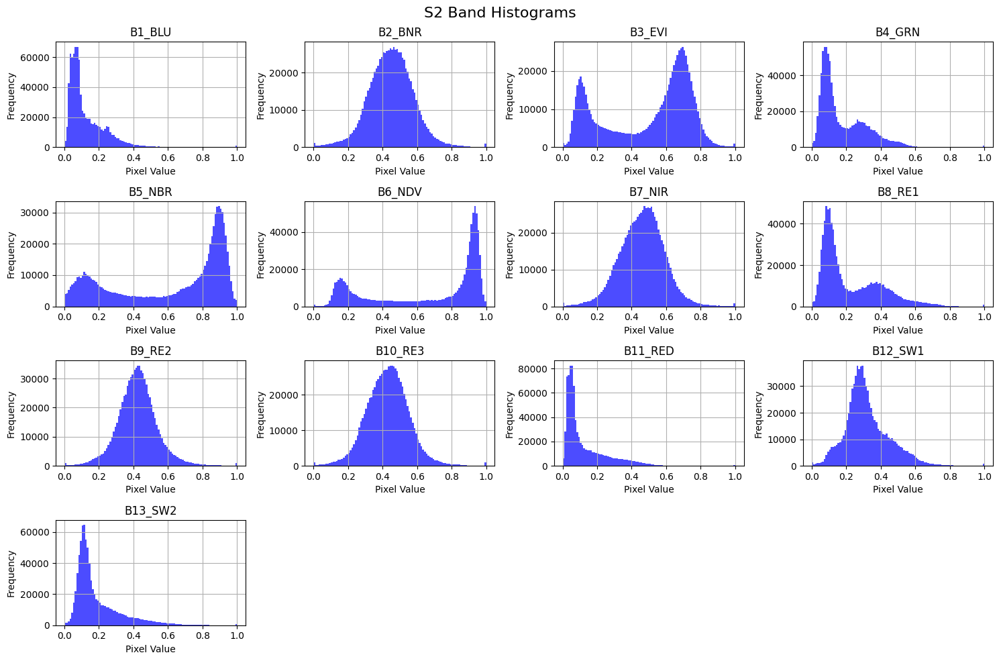

In [11]:
pt.plot_s2_histograms_and_percentiles(s2_np, num_bands=13,band_names=band_names)
pt.plot_s2_histograms_and_percentiles(s2_np2, num_bands=13,band_names=band_names)

## Stats ALS vs ForestMask

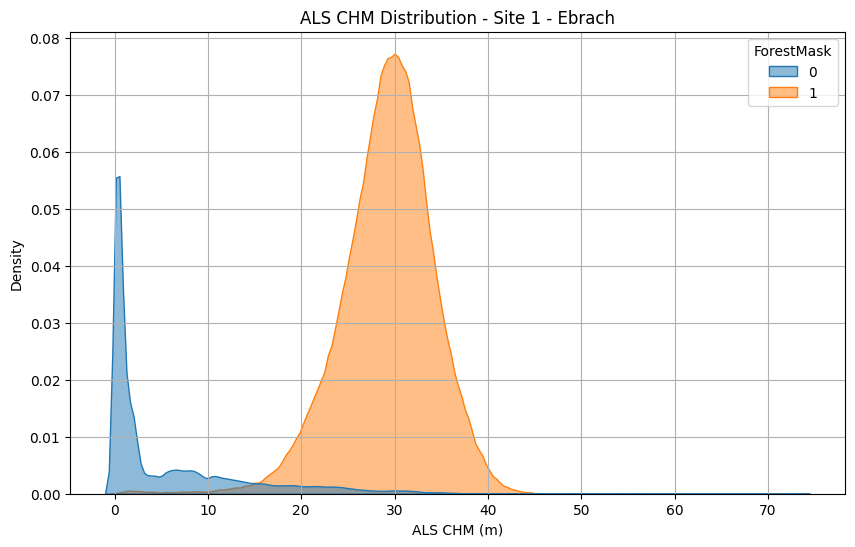

Some statistics for Site 1 - Ebrach:
Forest Mask: 			85.07% Forest
Share of ALS CHM > 2m: 		91.58%


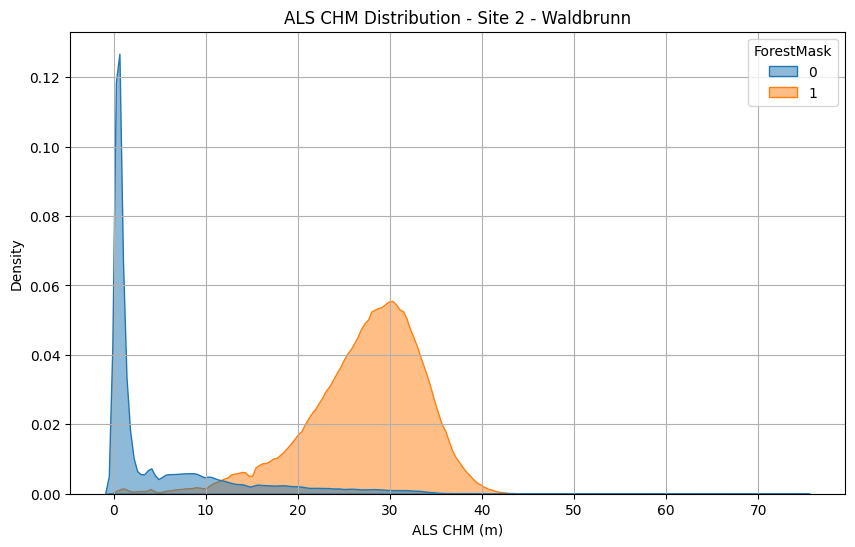

Some statistics for Site 2 - Waldbrunn:
Forest Mask: 			74.55% Forest
Share of ALS CHM > 2m: 		83.82%


In [ ]:
import seaborn as sns

def plot_als_distribution(als_np, fmask, site_name):
    als_flat = als_np.flatten()
    fmask_flat = fmask.flatten()
    df = pd.DataFrame({'ALS': als_flat, 'ForestMask': fmask_flat})
    df = df.dropna()
    df['ForestMask'] = df['ForestMask'].astype(int).astype('category')

    plt.figure(figsize=(10, 6))
    ax = sns.kdeplot(data=df, x='ALS', hue='ForestMask', common_norm=True, fill=True, alpha=0.5, bw_adjust=0.4)
    plt.xlabel('ALS CHM (m)')
    plt.ylabel('Density')
    plt.title(f'ALS CHM Distribution - {site_name}')
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(title='Forest Mask', loc='upper right')
    plt.grid()
    plt.show()
    # also group by forest mask and print a descriptive statistics
    print(f"Some statistics for {site_name}:")

    print(f"Forest Mask: \t\t\t{df['ForestMask'].value_counts(normalize=True)[1] * 100:.2f}% Forest")
    # now print the share of area with ALS > 2m: df['ALS'] > 2 / df['ALS'].notna()
    print(f"Share of ALS CHM > 2m: \t\t{(df['ALS'] > 2).sum() / df['ALS'].notna().sum() * 100:.2f}%")


    #df.groupby('ForestMask')['ALS'].describe()

plot_als_distribution(als_np, fmask1, 'Site 1 - Ebrach')
plot_als_distribution(als_np2, fmask2, 'Site 2 - Waldbrunn')


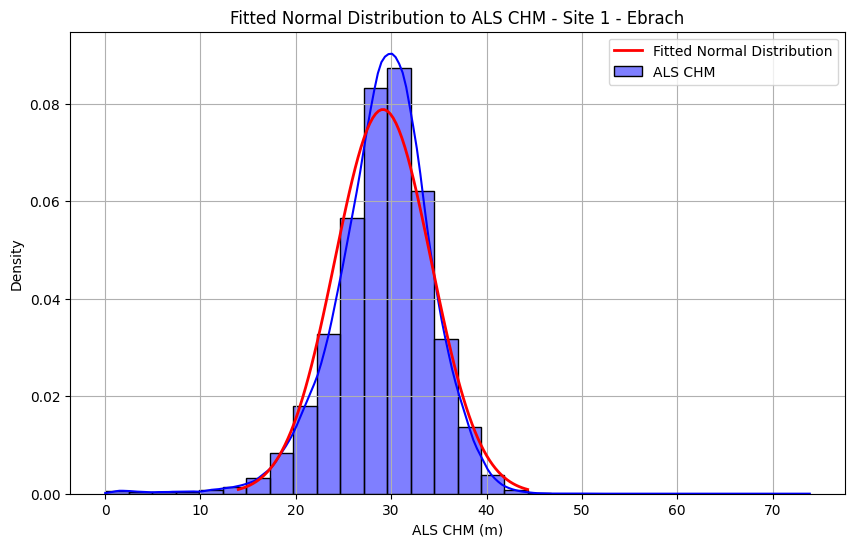

Fitted Normal Distribution Parameters for Site 1 - Ebrach:
Mean (mu): 29.14 m
Standard Deviation (std): 5.06 m


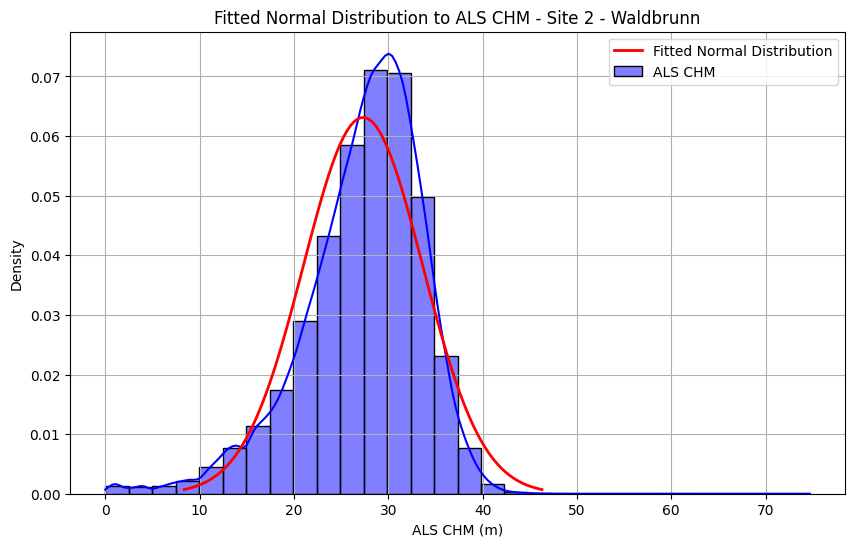

Fitted Normal Distribution Parameters for Site 2 - Waldbrunn:
Mean (mu): 27.33 m
Standard Deviation (std): 6.32 m


In [44]:
# now were only interested in the forest mask, so we can filter the ALS data. then we try to fit a statistical distribution to the data
def fit_distribution_to_als(als_np, fmask, site_name):
    als_flat = als_np.flatten()
    fmask_flat = fmask.flatten()
    df = pd.DataFrame({'ALS': als_flat, 'ForestMask': fmask_flat})
    df = df.dropna()
    df['ForestMask'] = df['ForestMask'].astype(int).astype('category')

    # Filter for forest mask
    df_forest = df[df['ForestMask'] == 1]

    # Fit a normal distribution to the ALS data
    mu, std = np.mean(df_forest['ALS']), np.std(df_forest['ALS'])
    
    # Plot the distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df_forest['ALS'], kde=True, stat='density', bins=30, color='blue', label='ALS CHM')
    
    # Plot the fitted normal distribution
    x = np.linspace(mu - 3*std, mu + 3*std, 100)
    p = (1 / (std * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu) / std) ** 2)
    plt.plot(x, p, 'r-', lw=2, label='Fitted Normal Distribution')
    
    plt.xlabel('ALS CHM (m)')
    plt.ylabel('Density')
    plt.title(f'Fitted Normal Distribution to ALS CHM - {site_name}')
    plt.legend()
    plt.grid()
    plt.show()
    # Print the parameters of the fitted distribution
    print(f"Fitted Normal Distribution Parameters for {site_name}:")
    print(f"Mean (mu): {mu:.2f} m")
    print(f"Standard Deviation (std): {std:.2f} m")

fit_distribution_to_als(als_np, fmask1, 'Site 1 - Ebrach')
fit_distribution_to_als(als_np2, fmask2, 'Site 2 - Waldbrunn')

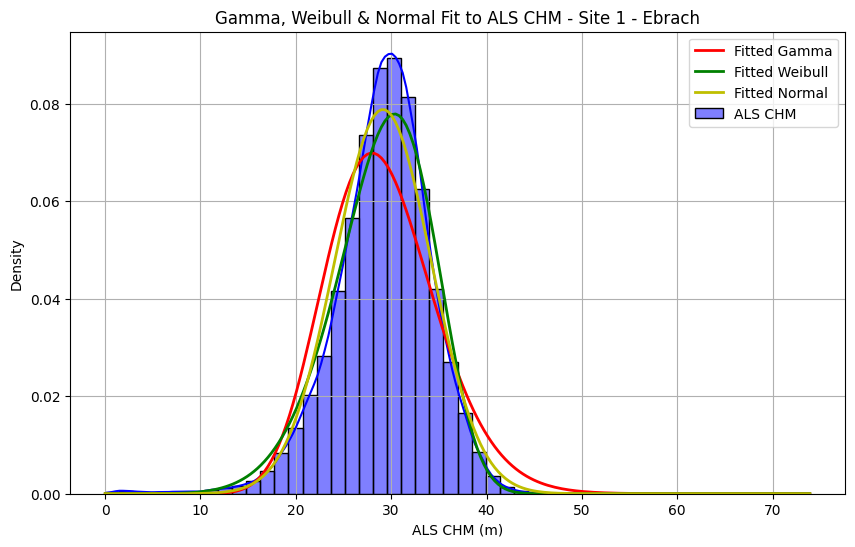

Gamma parameters for Site 1 - Ebrach: shape=25.23, loc=0.00, scale=1.16
Weibull parameters for Site 1 - Ebrach: shape=6.52, loc=0.00, scale=31.14
Normal parameters for Site 1 - Ebrach: mean=29.14, std=5.06

Log-likelihoods:
  Gamma:   -1341583.87
  Weibull: -1289231.08
  Normal:  -1289108.16

AIC (lower is better):
  Gamma:   2683171.75
  Weibull: 2578466.16
  Normal:  2578220.32


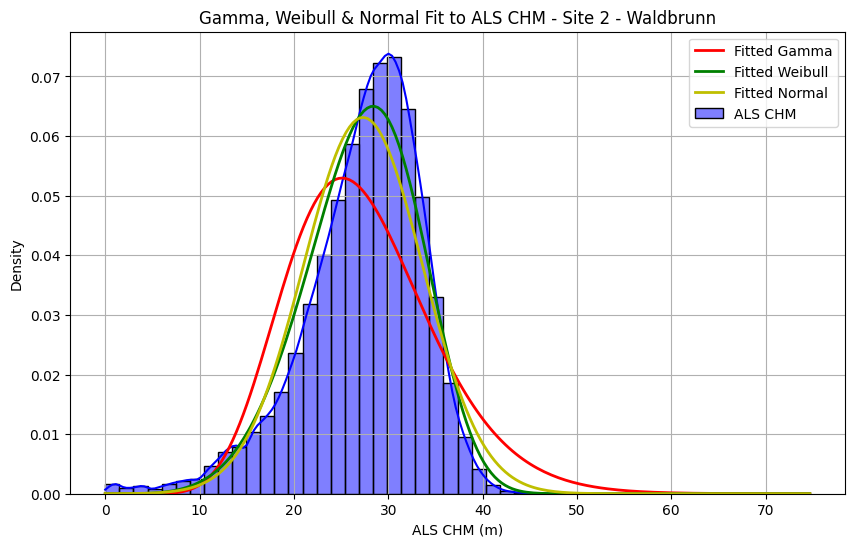

Gamma parameters for Site 2 - Waldbrunn: shape=12.27, loc=0.00, scale=2.23
Weibull parameters for Site 2 - Waldbrunn: shape=5.13, loc=0.00, scale=29.63
Normal parameters for Site 2 - Waldbrunn: mean=27.33, std=6.32

Log-likelihoods:
  Gamma:   -1140581.51
  Weibull: -1078157.40
  Normal:  -1079996.75

AIC (lower is better):
  Gamma:   2281167.03
  Weibull: 2156318.80
  Normal:  2159997.50


In [50]:
from scipy.stats import gamma, weibull_min, norm

def fit_gamma_weibull_normal_to_als(als_np, fmask, site_name):
    als_flat = als_np.flatten()
    fmask_flat = fmask.flatten()
    df = pd.DataFrame({'ALS': als_flat, 'ForestMask': fmask_flat})
    df = df.dropna()
    df['ForestMask'] = df['ForestMask'].astype(int).astype('category')

    # Filter for forest mask
    df_forest = df[df['ForestMask'] == 1]
    als_forest = df_forest['ALS'].values

    # Fit distributions
    gamma_params = gamma.fit(als_forest, floc=0)
    weibull_params = weibull_min.fit(als_forest, floc=0)
    norm_params = norm.fit(als_forest)

    # Plot histogram and fitted distributions
    plt.figure(figsize=(10, 6))
    sns.histplot(als_forest, kde=True, stat='density', bins=50, color='blue', label='ALS CHM')

    x = np.linspace(als_forest.min(), als_forest.max(), 200)
    plt.plot(x, gamma.pdf(x, *gamma_params), 'r-', lw=2, label='Fitted Gamma')
    plt.plot(x, weibull_min.pdf(x, *weibull_params), 'g-', lw=2, label='Fitted Weibull')
    plt.plot(x, norm.pdf(x, *norm_params), 'y-', lw=2, label='Fitted Normal')

    plt.xlabel('ALS CHM (m)')
    plt.ylabel('Density')
    plt.title(f'Gamma, Weibull & Normal Fit to ALS CHM - {site_name}')
    plt.legend()
    plt.grid()
    plt.show()

    # Calculate log-likelihoods and AIC for each distribution
    loglik_gamma = np.sum(gamma.logpdf(als_forest, *gamma_params))
    loglik_weibull = np.sum(weibull_min.logpdf(als_forest, *weibull_params))
    loglik_norm = np.sum(norm.logpdf(als_forest, *norm_params))

    n = len(als_forest)
    k_gamma = 2  # shape, scale (loc fixed)
    k_weibull = 2  # shape, scale (loc fixed)
    k_norm = 2  # mean, std

    aic_gamma = 2 * k_gamma - 2 * loglik_gamma
    aic_weibull = 2 * k_weibull - 2 * loglik_weibull
    aic_norm = 2 * k_norm - 2 * loglik_norm

    print(f"Gamma parameters for {site_name}: shape={gamma_params[0]:.2f}, loc={gamma_params[1]:.2f}, scale={gamma_params[2]:.2f}")
    print(f"Weibull parameters for {site_name}: shape={weibull_params[0]:.2f}, loc={weibull_params[1]:.2f}, scale={weibull_params[2]:.2f}")
    print(f"Normal parameters for {site_name}: mean={norm_params[0]:.2f}, std={norm_params[1]:.2f}")
    print()
    print(f"Log-likelihoods:")
    print(f"  Gamma:   {loglik_gamma:.2f}")
    print(f"  Weibull: {loglik_weibull:.2f}")
    print(f"  Normal:  {loglik_norm:.2f}")
    print()
    print(f"AIC (lower is better):")
    print(f"  Gamma:   {aic_gamma:.2f}")
    print(f"  Weibull: {aic_weibull:.2f}")
    print(f"  Normal:  {aic_norm:.2f}")

fit_gamma_weibull_normal_to_als(als_np, fmask1, 'Site 1 - Ebrach')
fit_gamma_weibull_normal_to_als(als_np2, fmask2, 'Site 2 - Waldbrunn')

# ALS Normalization

## ... each site individually

In [13]:
import json

# now i want a way to normalize the als data, and store their parameters for later use
def normalize_als(als_np, fmask, site_name, als_path=ALS_PATH1_RES):
    als_flat = als_np.flatten()
    fmask_flat = fmask.flatten()
    df = pd.DataFrame({'ALS': als_flat, 'ForestMask': fmask_flat})
    df = df.dropna()
    df['ForestMask'] = df['ForestMask'].astype(int).astype('category')

    # Filter for forest mask
    df_forest = df[df['ForestMask'] == 1]
    als_forest = df_forest['ALS'].values

    # Fit a normal distribution to the ALS data
    mu, std = np.mean(als_forest), np.std(als_forest)

    # Normalize the ALS data
    als_normalized = (als_np - mu) / std

    # Save the normalization parameters
    normalization_params = {
        'site_name': site_name,
        'mu': mu,
        'std': std
    }
    normalization_file = f'../data/02_processed/ALS_norm_params_{site_name}.json'
    # Save the normalization parameters as a JSON file (do it here, not in bsc)
    # Convert float32 to float for JSON serialization
    normalization_params = {k: float(v) if isinstance(v, np.floating) else v for k, v in normalization_params.items()}
    with open(normalization_file, 'w') as f:
        json.dump(normalization_params, f, indent=4)

    print(f"Normalization parameters saved to {normalization_file}")

    # also save the normalized ALS data
    normalized_als_file = f'../data/02_processed/ALS_norm_{site_name}.tif'
    # save the normalized ALS data as a GeoTIFF
    # Use the transform and crs from the reference ALS file
    ref_path = als_path if 'als_path' in locals() else ALS_PATH1_RES
    with rasterio.open(ref_path) as ref:
        transform = ref.transform
        crs = ref.crs

    with rasterio.open(normalized_als_file, 'w', driver='GTiff',
                       height=als_normalized.shape[0],
                       width=als_normalized.shape[1],
                       count=1,
                       dtype=als_normalized.dtype,
                       crs=crs,
                       transform=transform) as dst:
        dst.write(als_normalized, 1)
        dst.write(als_normalized, 1)

    return als_normalized, normalization_params

In [14]:
als_normalized1,_ = normalize_als(als_np, fmask1, 'Site1_Ebrach',ALS_PATH1_RES)
als_normalized2,_ = normalize_als(als_np2, fmask2, 'Site2_Waldbrunn',ALS_PATH2_RES)

Normalization parameters saved to ../data/02_processed/ALS_norm_params_Site1_Ebrach.json
Normalization parameters saved to ../data/02_processed/ALS_norm_params_Site2_Waldbrunn.json


## ... for the union of both ALS Sites

In [10]:
# Variant 2: Calculate normalization parameters over the union of both sites (forest areas only),
# then normalize each ALS file using these joint parameters and store them.
import json

def compute_joint_als_norm_params(als1, fmask1, als2, fmask2):
    # Ensure fmasks are integer type for comparison
    fmask1_bin = (fmask1.astype(int) == 1)
    fmask2_bin = (fmask2.astype(int) == 1)

    # Mask out NaNs in ALS arrays and select only forest pixels
    als1_valid = als1[~np.isnan(als1) & fmask1_bin]
    als2_valid = als2[~np.isnan(als2) & fmask2_bin]

    # Concatenate valid forest ALS values from both sites
    als_union = np.concatenate([als1_valid, als2_valid])

    # Remove any remaining NaNs (shouldn't be any, but for safety)
    als_union = als_union[~np.isnan(als_union)]

    mu = np.mean(als_union)
    std = np.std(als_union)
    print(f"Joint normalization parameters:\n \tµ: \t{mu:.2f}m\n \tstd: \t{std:.2f}m")
    return mu, std

def normalize_als_with_params(als_np, mu, std, als_path, out_name):
    als_normalized = (als_np - mu) / std
    # Save normalized ALS as GeoTIFF
    with rasterio.open(als_path) as ref:
        transform = ref.transform
        crs = ref.crs
    out_path = f'../data/02_processed/ALS_norm_{out_name}_joint.tif'
    with rasterio.open(out_path, 'w', driver='GTiff',
                       height=als_normalized.shape[0],
                       width=als_normalized.shape[1],
                       count=1,
                       dtype=als_normalized.dtype,
                       crs=crs,
                       transform=transform) as dst:
        dst.write(als_normalized, 1)
    return als_normalized

# Compute joint normalization parameters
mu_joint, std_joint = compute_joint_als_norm_params(als_np, fmask1, als_np2, fmask2)

# Save joint parameters
joint_params = {'mu': float(mu_joint), 'std': float(std_joint)}
with open('../data/02_processed/ALS_norm_params_joint.json', 'w') as f:
    json.dump(joint_params, f, indent=4)
print("Joint normalization parameters saved to ../data/02_processed/ALS_norm_params_joint.json")

# Normalize both ALS datasets using joint parameters
als_normalized1_joint = normalize_als_with_params(als_np, mu_joint, std_joint, ALS_PATH1_RES, 'Site1_Ebrach')
als_normalized2_joint = normalize_als_with_params(als_np2, mu_joint, std_joint, ALS_PATH2_RES, 'Site2_Waldbrunn')


Joint normalization parameters:
 	µ: 	28.35m
 	std: 	5.72m
Joint normalization parameters saved to ../data/02_processed/ALS_norm_params_joint.json


little sanity check

In [15]:
nan_count = np.sum(np.isnan(als_normalized1))
print(f"Number of NaN values in normalized ALS Site 1: {nan_count}")

Number of NaN values in normalized ALS Site 1: 551421


In [17]:
nan_count = np.sum(np.isnan(als_normalized1_joint))
print(f"Number of NaN values in normalized ALS Site 1 joint: {nan_count}")

Number of NaN values in normalized ALS Site 1 joint: 551421
